In [1]:
from IPython.core.display import HTML
HTML("<style>.container { width:90% !important; }</style>")

In [2]:
%matplotlib inline
import glob
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

from scipy import fftpack
from skimage.filters import threshold_adaptive
import imutils

plt.rcParams['figure.figsize'] = (25.0, 10.0)


def show_image(image, depth, title):
    if depth == 'g':
        disptemp = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        plt.title(title), plt.xticks([]), plt.yticks([])
        plt.imshow(disptemp)
#         plt.show()
    elif depth == 'c':
        disptemp = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.title(title), plt.xticks([]), plt.yticks([])
        plt.imshow(disptemp)
#         plt.show()
    else:
        print "Unknown color type."

In [3]:
# All the smart parts of this code taken from 
# http://www.pyimagesearch.com/2014/09/01/build-kick-ass-mobile-document-scanner-just-5-minutes/
# by Adrian Rosebrock.  I just made it work in a notebook.

def order_points(pts):
	# initialzie a list of coordinates that will be ordered
	# such that the first entry in the list is the top-left,
	# the second entry is the top-right, the third is the
	# bottom-right, and the fourth is the bottom-left
	rect = np.zeros((4, 2), dtype = "float32")

	# the top-left point will have the smallest sum, whereas
	# the bottom-right point will have the largest sum
	s = pts.sum(axis = 1)
	rect[0] = pts[np.argmin(s)]
	rect[2] = pts[np.argmax(s)]

	# now, compute the difference between the points, the
	# top-right point will have the smallest difference,
	# whereas the bottom-left will have the largest difference
	diff = np.diff(pts, axis = 1)
	rect[1] = pts[np.argmin(diff)]
	rect[3] = pts[np.argmax(diff)]

	# return the ordered coordinates
	return rect

def four_point_transform(image, pts):
	# obtain a consistent order of the points and unpack them
	# individually
	rect = order_points(pts)
	(tl, tr, br, bl) = rect

	# compute the width of the new image, which will be the
	# maximum distance between bottom-right and bottom-left
	# x-coordiates or the top-right and top-left x-coordinates
	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))

	# compute the height of the new image, which will be the
	# maximum distance between the top-right and bottom-right
	# y-coordinates or the top-left and bottom-left y-coordinates
	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))

	# now that we have the dimensions of the new image, construct
	# the set of destination points to obtain a "birds eye view",
	# (i.e. top-down view) of the image, again specifying points
	# in the top-left, top-right, bottom-right, and bottom-left
	# order
	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")

	# compute the perspective transform matrix and then apply it
	M = cv2.getPerspectiveTransform(rect, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

	# return the warped image
	return warped

In [25]:
def crop_image(filename, mint=50, maxt=100):
    # load the image and compute the ratio of the old height
    # to the new height, clone it, and resize it
    image = cv2.imread(filename)
    ratio = image.shape[0] / 500.0
    orig = image.copy()
    image = imutils.resize(image, height = 500)

    # convert the image to grayscale, blur it, and find edges
    # in the image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    edged = cv2.Canny(gray, mint, maxt)


    # find the contours in the edged image, keeping only the
    # largest ones, and initialize the screen contour
    (cnts, _) = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]

    # loop over the contours
    for c in cnts:
        # approximate the contour
        peri = cv2.arcLength(c, True)
        approx = cv2.approxPolyDP(c, 0.02 * peri, True)

        # if our approximated contour has four points, then we
        # can assume that we have found our screen
        if len(approx) == 4:
            screenCnt = approx
            break

    # show the contour (outline) of the piece of paper
    cv2.drawContours(image, [screenCnt], -1, (0, 255, 0), 2)


    # apply the four point transform to obtain a top-down
    # view of the original image
    warped = four_point_transform(orig, screenCnt.reshape(4, 2) * ratio)

    # convert the warped image to grayscale, then threshold it
    # to give it that 'black and white' paper effect
    warped = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    warped = threshold_adaptive(warped, 250, offset = 10)
    warped = warped.astype("uint8") * 255

    # show the original and scanned images
    fig = plt.figure()
    plt.subplot(141)
    show_image(orig, 'c', os.path.basename(filename))
    plt.subplot(142)
    show_image(edged, 'g', 'Edges')
    plt.subplot(143)
    show_image(image, 'c', 'Biggest Closed Trapezoid')
    plt.subplot(144)
    show_image(warped, 'g', 'Cropped/Transformed')

    return


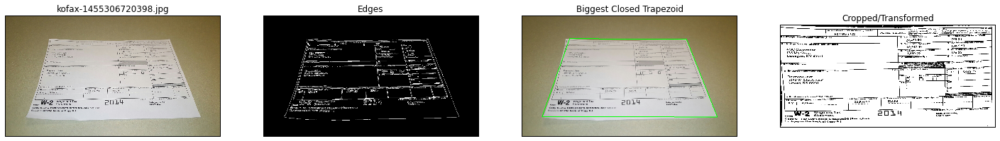

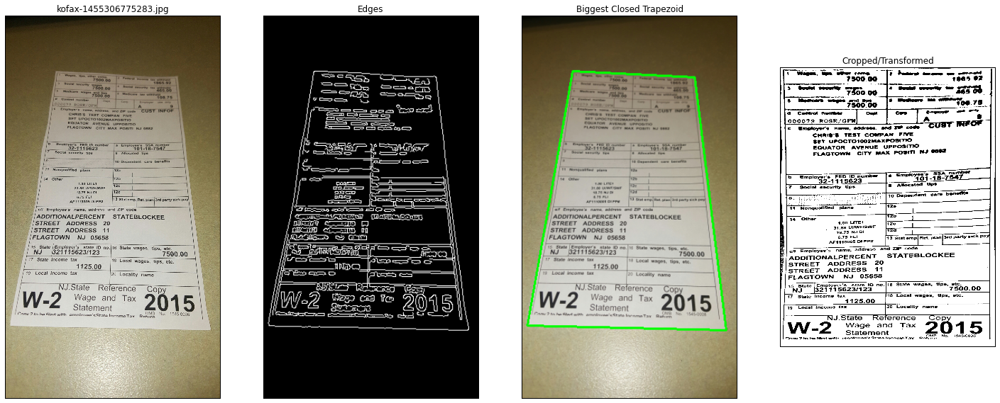

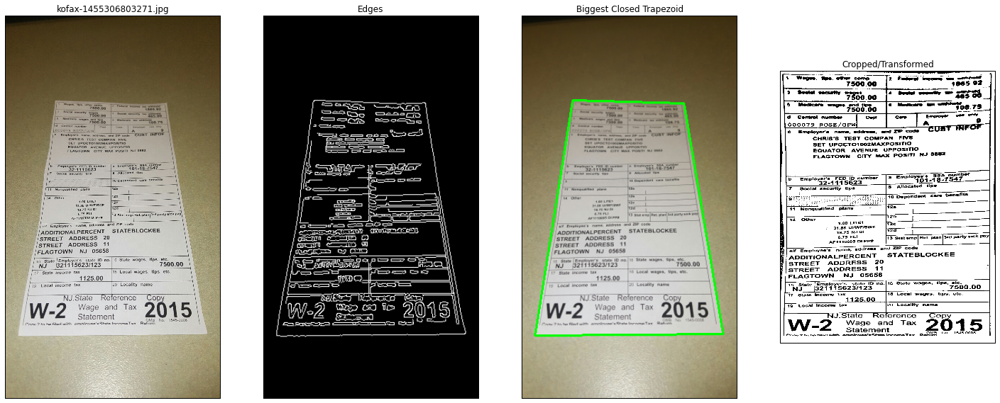

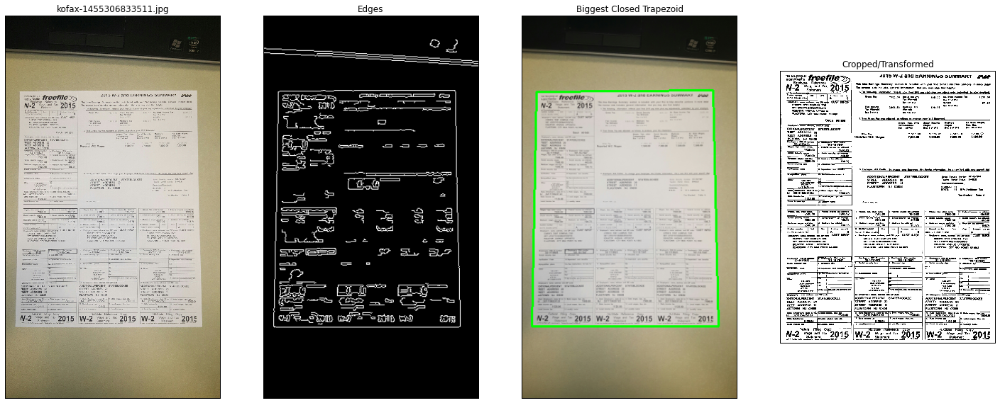

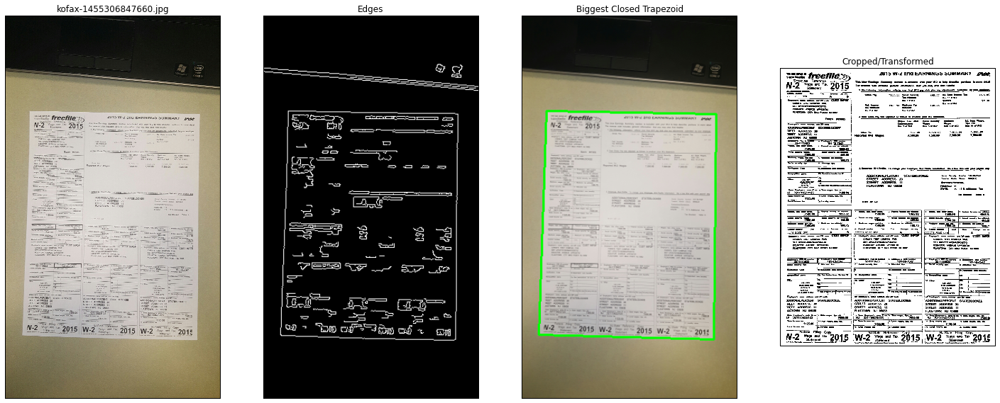

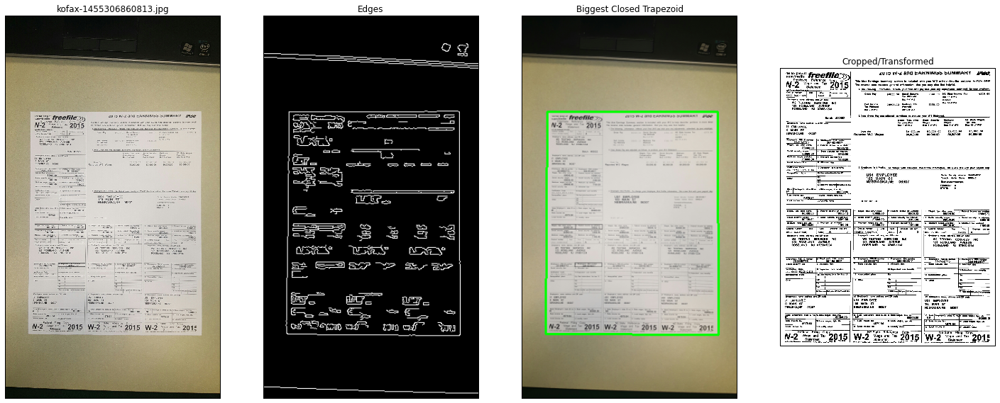

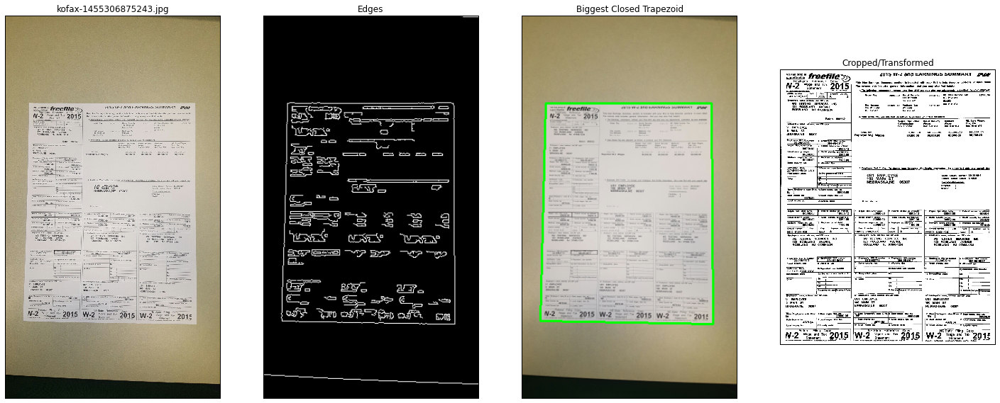

In [7]:
path = '/Users/dave.sergeant/Downloads/2016.02.16/Full Images/*.jpg'
for fname in glob.glob(path):
    crop_image(fname)

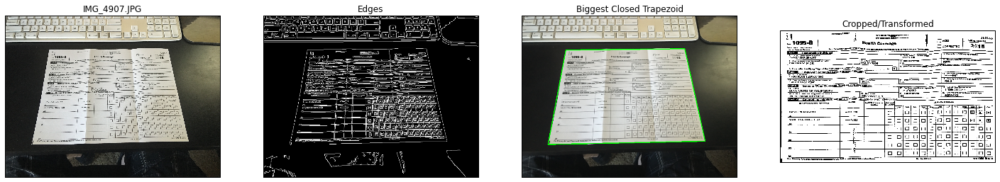

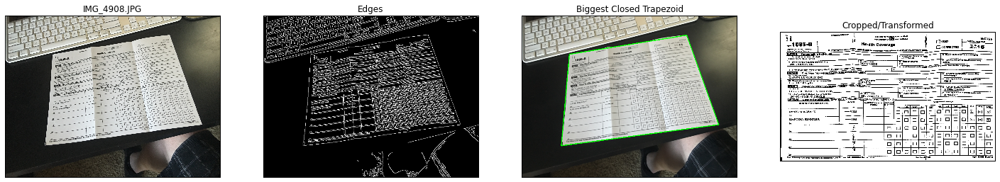

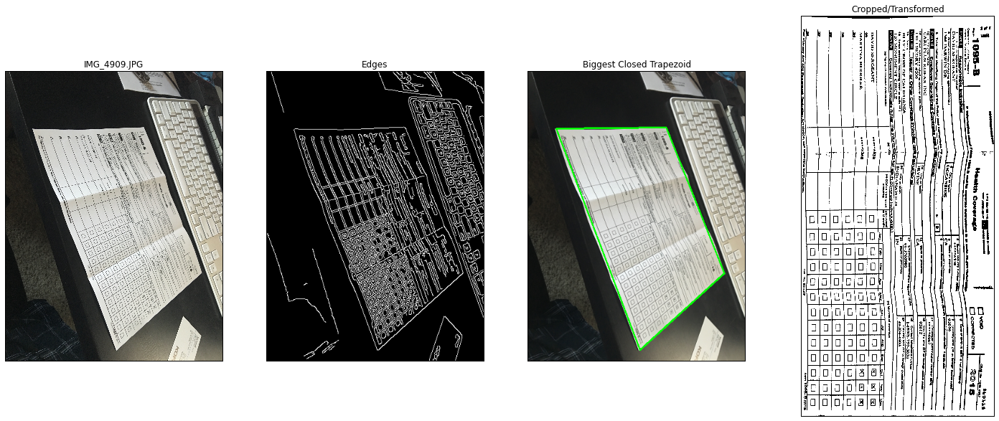

In [21]:
crop_image('/Users/dave.sergeant/Downloads/2016.02.21/IMG_4907.JPG')
crop_image('/Users/dave.sergeant/Downloads/2016.02.21/IMG_4908.JPG')
crop_image('/Users/dave.sergeant/Downloads/2016.02.21/IMG_4909.JPG')

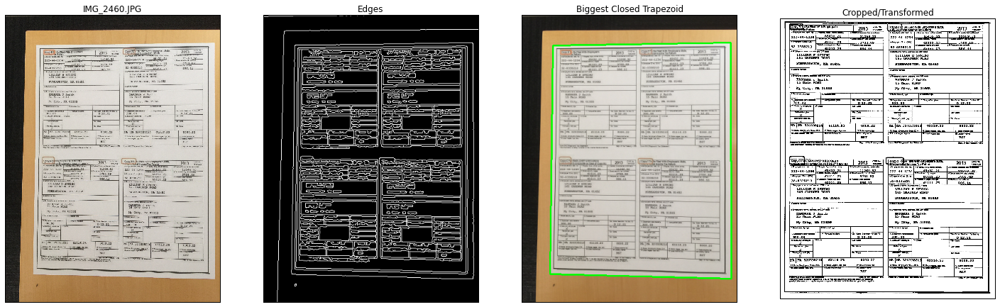

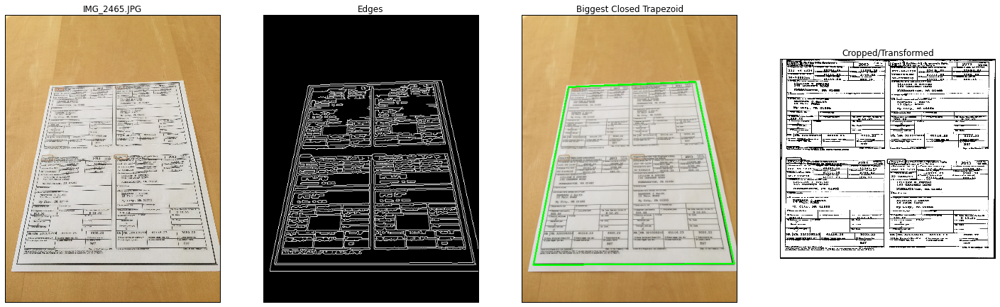

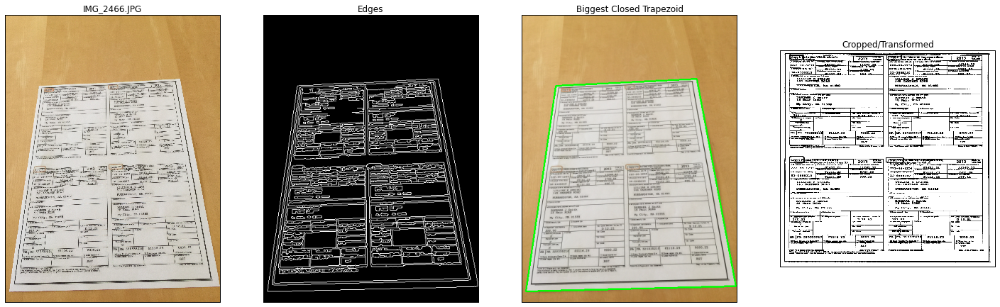

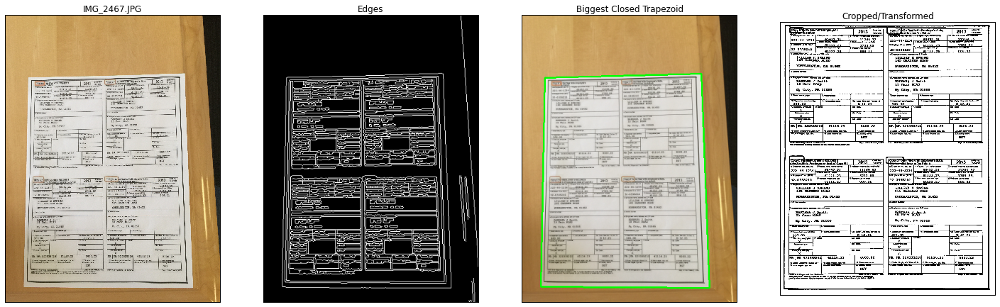

In [64]:
path = '/private/var/folders/2k/zf5h9bkn3xn005ccfjw9f35r_bxrp1/T/com.microsoft.Outlook/Outlook Temp/Test Set/*.JPG'
for fname in glob.glob(path):
    crop_image(fname)